# Predicting Win in League of Legends (Diamond Rank) Based Off the First 10 Minutes
## (Classification)

### PLANNING---Wrangling---Exploration---Modeling---Delivery
# Project planning:
* Aquire data from Kaggle
 
* Prepare data
   * Create engineered columns from existing data
       * blueassists
       * bluekills
   * Convert all letters to lowercase
   * Set gameid to index
 
* Explore data in search of drivers of blue team wins
   * Answer the following initial questions
       * Are there any surprises in the data?
       * Does a higher KDA (Kill/Death/Assist ratio) lead to higher rate of wins?
       * How often has winning occured compared to losing?
       * Does vision control (wards placed and destroyed) affect win rate?
       * Does whether the team gets the first kill affect win rate?
       * Do elite monster kills affect win rate?
       * Do minion kills affect win rate?
       * Does difference in gold or experience compared to the other team affect win rate?
       * Does gold per minute affect win rate?
      
* Develop a model to predict if a diamond player will win or not based off the first 10 minutes of a game
   * Use drivers identified in explore to build predictive models of different types
   * Evaluate models on train and validate data
   * Select the best model based on highest accuracy
   * Evaluate the best model on test data

## Imports

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE, SelectKBest, f_regression
from scipy import stats
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import\
DecisionTreeClassifier as DT
from sklearn import svm
pd.set_option('display.max_columns', None)
from wrangle import wrangle_league, display_numeric_column_histograms

### Planning---WRANGLING---Exploration---Modeling---Delivery

In [4]:
train, val, test = wrangle_league()
train.T

gameid                        4527439661  4486000436  4520010999  4521968003  \
bluewins                             1.0         0.0         0.0         0.0   
bluewardsplaced                     20.0        18.0        18.0        14.0   
bluewardsdestroyed                   0.0         2.0         3.0         1.0   
bluefirstblood                       1.0         0.0         0.0         1.0   
bluekills                           13.0         3.0         3.0         5.0   
bluedeaths                           8.0         9.0         7.0         4.0   
blueassists                         20.0         4.0         3.0         5.0   
blueelitemonsters                    1.0         1.0         1.0         0.0   
bluedragons                          1.0         1.0         1.0         0.0   
blueheralds                          0.0         0.0         0.0         0.0   
bluetowersdestroyed                  0.0         0.0         0.0         0.0   
bluetotalgold                    17564.0     15280.0     15335.0     16062.0   
blueavglevel                         6.6         6.6         6.6         6.8   
bluetotalexperience              15596.0     16614.0     17368.0     17907.0   
bluetotalminionskilled             167.0       220.0       234.0       195.0   
bluetotaljungleminionskilled        28.0        50.0        60.0        61.0   
bluegolddiff                      2032.0     -2034.0     -1716.0        39.0   
blueexperiencediff                1193.0     -1071.0     -1601.0     -1075.0   
bluecspermin                        16.7        22.0        23.4        19.5   
bluegoldpermin                    1756.4      1528.0      1533.5      1606.2   
redwardsplaced                      18.0        19.0        16.0        48.0   
redwardsdestroyed                    2.0         5.0         6.0         3.0   
redfirstblood                        0.0         1.0         1.0         0.0   
redkills                             8.0         9.0         7.0         4.0   
reddeaths                           13.0         3.0         3.0         5.0   
redassists                          10.0        17.0         5.0         3.0   
redelitemonsters                     0.0         0.0         0.0         1.0   
reddragons                           0.0         0.0         0.0         1.0   
redheralds                           0.0         0.0         0.0         0.0   
redtowersdestroyed                   0.0         0.0         0.0         0.0   
redtotalgold                     15532.0     17314.0     17051.0     16023.0   
redavglevel                          6.0         6.8         7.2         7.2   
redtotalexperience               14403.0     17685.0     18969.0     18982.0   
redtotalminionskilled              170.0       220.0       262.0       237.0   
redtotaljungleminionskilled         34.0        37.0        36.0        61.0   
redgolddiff                      -2032.0      2034.0      1716.0       -39.0   
redexperiencediff                -1193.0      1071.0      1601.0      1075.0   
redcspermin                         17.0        22.0        26.2        23.7   
redgoldpermin                     1553.2      1731.4      1705.1      1602.3   
bluekilldiff                         5.0        -6.0        -4.0         1.0   
blueassistdiff                      10.0       -13.0        -2.0         2.0   

gameid                        4497647589  4526234788  4522164881  4500073526  \
bluewins                             1.0         1.0         0.0         1.0   
bluewardsplaced                     18.0        45.0        42.0        14.0   
bluewardsdestroyed                   2.0         2.0         2.0         2.0   
bluefirstblood                       1.0         0.0         1.0         0.0   
bluekills                            8.0         5.0         5.0         7.0   
bluedeaths                           0.0         8.0         3.0         5.0   
blueassists                          6.0         5.0         1.0         5.0   

### Planning---Wrangling---EXPLORATION---Modeling---Delivery

In [9]:
train.describe()

,bluewins,bluewardsplaced,bluewardsdestroyed,bluefirstblood,bluekills,bluedeaths,blueassists,blueelitemonsters,bluedragons,blueheralds,bluetowersdestroyed,bluetotalgold,blueavglevel,bluetotalexperience,bluetotalminionskilled,bluetotaljungleminionskilled,bluegolddiff,blueexperiencediff,bluecspermin,bluegoldpermin,redwardsplaced,redwardsdestroyed,redfirstblood,redkills,reddeaths,redassists,redelitemonsters,reddragons,redheralds,redtowersdestroyed,redtotalgold,redavglevel,redtotalexperience,redtotalminionskilled,redtotaljungleminionskilled,redgolddiff,redexperiencediff,redcspermin,redgoldpermin,bluekilldiff,blueassistdiff
count,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.000000,5532.00000,5532.000000,5532.000000
mean,0.502531,22.278200,2.834779,0.509400,6.202458,6.146602,6.650217,0.557303,0.361714,0.195589,0.054049,16517.908351,6.918221,17931.447758,216.605206,50.539949,31.841649,-11.968727,21.660521,1651.790835,22.462943,2.723789,0.490600,6.146602,6.202458,6.675705,0.564895,0.408351,0.156544,0.043926,16486.066703,6.920499,17943.416486,217.071764,51.184743,-31.841649,11.968727,21.707176,1648.60667,0.055857,-0.025488
std,0.500039,17.843951,2.173499,0.499957,3.036666,2.976862,4.061723,0.628215,0.480540,0.396690,0.253288,1543.056382,0.309730,1212.107955,21.709001,9.812177,2460.768944,1932.365889,2.170900,154.305638,19.039936,2.192340,0.499957,2.976862,3.036666,4.068217,0.621396,0.491573,0.363403,0.218609,1498.920299,0.306913,1205.464829,21.839276,9.910677,2460.768944,1932.365889,2.183928,149.89203,4.234829,5.772825
min,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12178.000000,4.600000,10098.000000,90.000000,0.000000,-10329.000000,-8531.000000,9.000000,1217.800000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11212.000000,4.800000,10465.000000,117.000000,4.000000,-11467.000000,-8348.000000,11.700000,1121.20000,-17.000000,-21.000000
25%,0.000000,14.000000,1.000000,0.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,15427.750000,6.800000,17171.750000,202.000000,44.000000,-1556.000000,-1283.250000,20.200000,1542.775000,14.000000,1.000000,0.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,15424.000000,6.800000,17201.750000,203.000000,44.000000,-1598.000000,-1239.250000,20.300000,1542.40000,-3.000000,-4.000000
50%,1.000000,16.500000,3.000000,1.000000,6.000000,6.000000,6.000000,0.000000,0.000000,0.000000,0.000000,16412.000000,7.000000,17962.500000,217.500000,50.000000,59.500000,-12.000000,21.750000,1641.200000,16.000000,2.000000,0.000000,6.000000,6.000000,6.000000,0.000000,0.000000,0.000000,0.000000,16377.000000,7.000000,17962.000000,218.000000,51.000000,-59.500000,12.000000,21.800000,1637.70000,0.000000,0.000000
75%,1.000000,20.000000,4.000000,1.000000,8.000000,8.000000,9.000000,1.000000,1.000000,0.000000,0.000000,17465.250000,7.200000,18731.250000,232.000000,56.000000,1598.000000,1239.250000,23.200000,1746.525000,20.000000,4.000000,1.000000,8.000000,8.000000,9.000000,1.000000,1.000000,0.000000,0.000000,17403.250000,7.200000,18748.250000,232.000000,57.000000,1556.000000,1283.250000,23.200000,1740.32500,3.000000,4.000000
max,1.000000,221.000000,27.000000,1.000000,22.000000,22.000000,29.000000,2.000000,1.000000,1.000000,4.000000,23424.000000,8.000000,22224.000000,281.000000,85.000000,11467.000000,8348.000000,28.100000,2342.400000,276.000000,23.000000,1.000000,22.000000,22.000000,26.000000,2.000000,1.000000,1.000000,2.000000,22732.000000,8.000000,21967.000000,289.000000,92.000000,10329.000000,8531.000000,28.

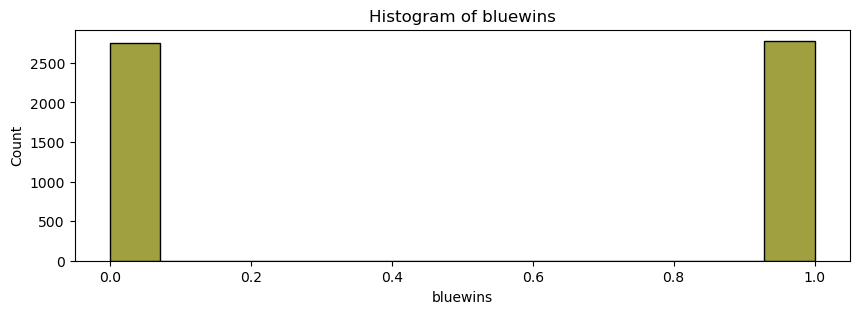

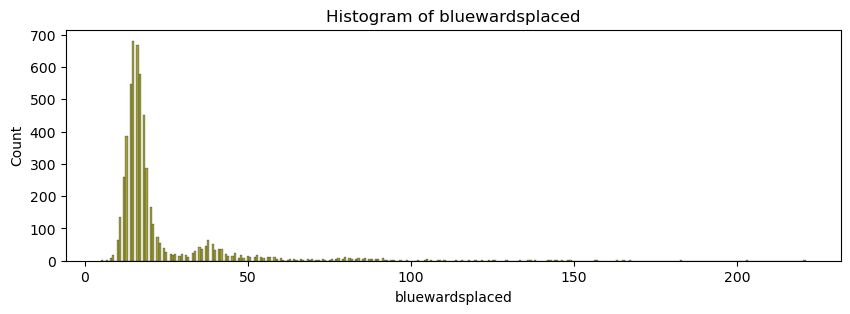

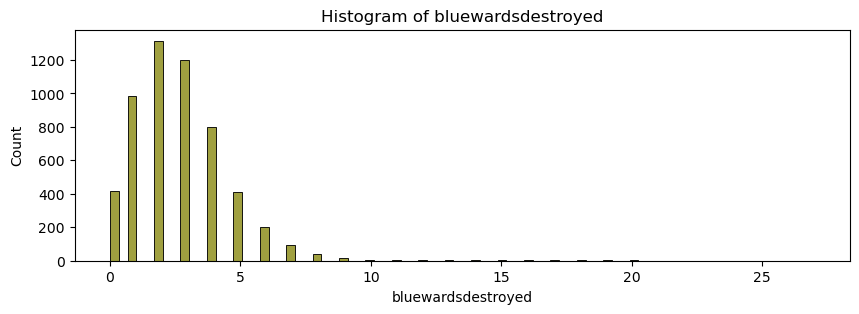

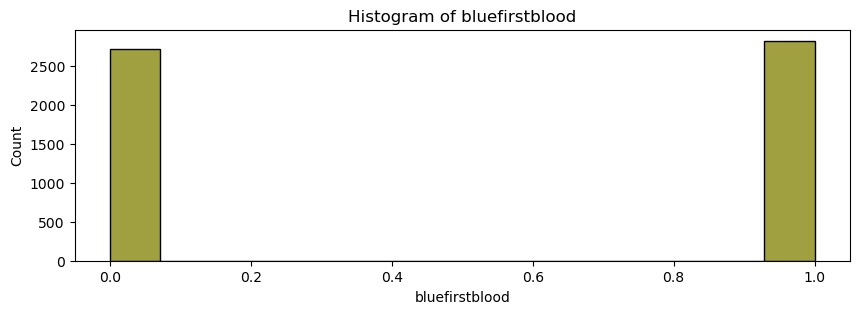

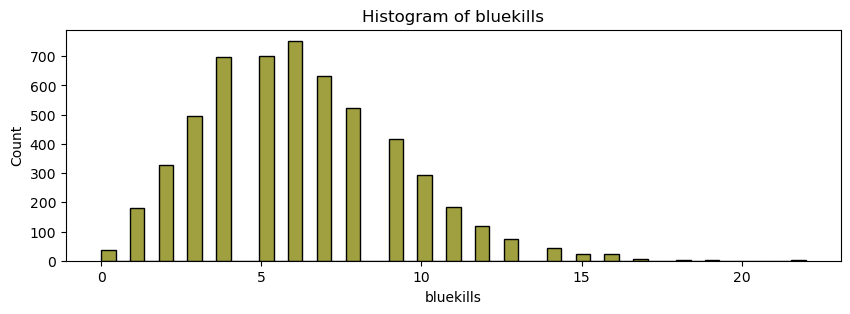

...

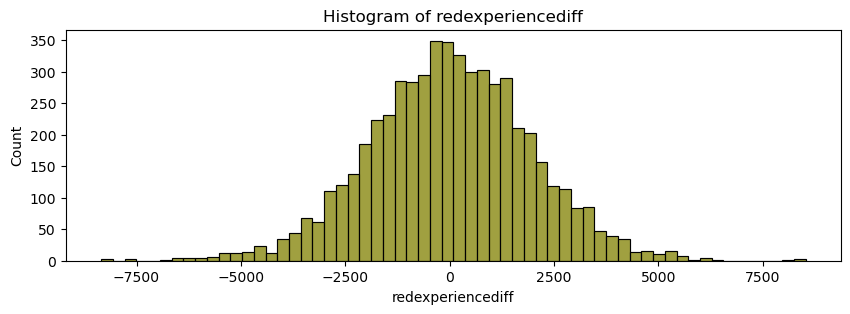

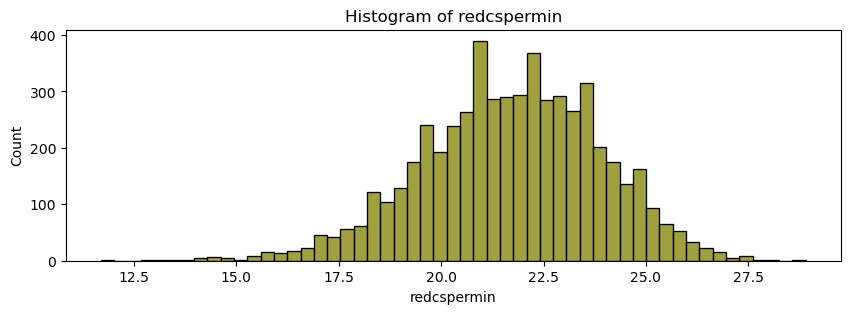

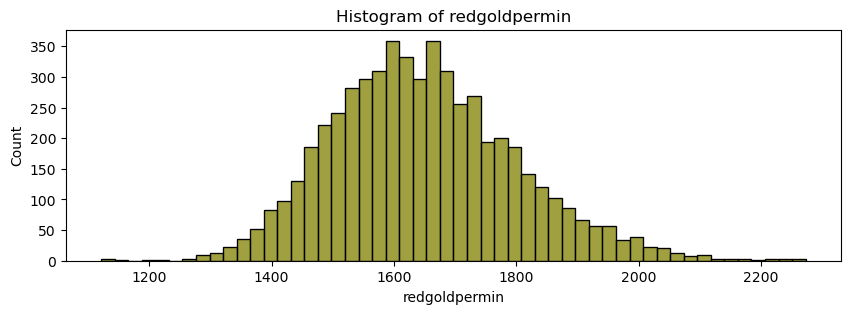

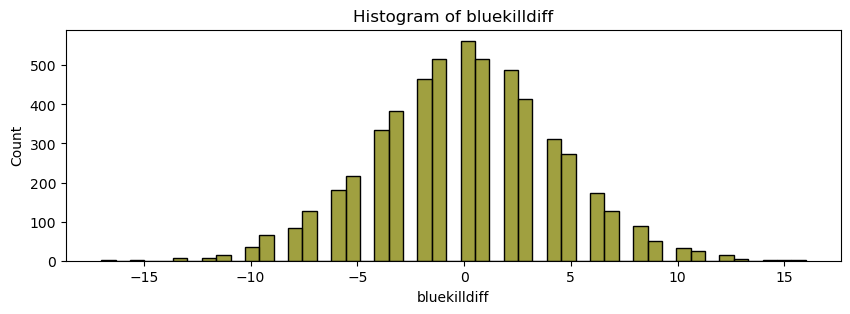

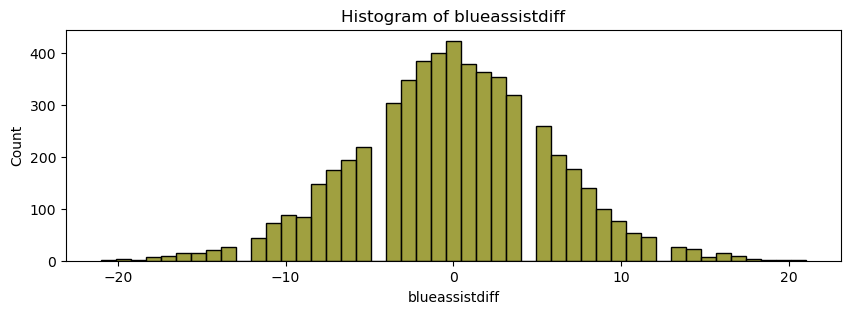

In [7]:
display_numeric_column_histograms(train)

## Columns I initially suspect to be drivers of blue team win:
* bluefirstblood
* bluekills
* bluedeaths
* blueelitemonsters
* blueexperiencediff
* bluegolddiff
* bluetotalexperience
* bluekilldiff
* blueassistdiff

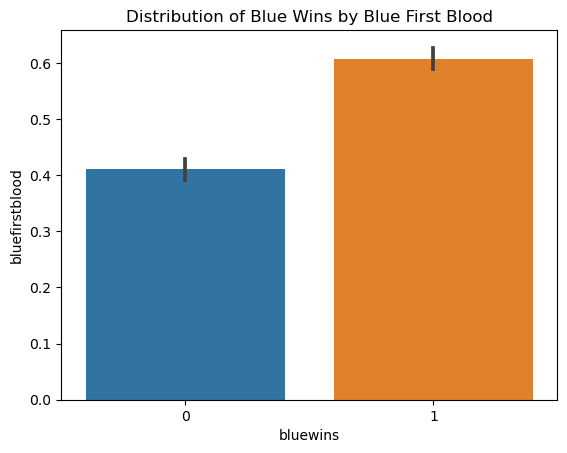

In [ ]:
sns.barplot(x='bluewins', y='bluefirstblood', data=train)
plt.title('Distribution of Blue Wins by Blue First Blood')
plt.show()

## Looks like getting the first kill leads to a higher chance of winning

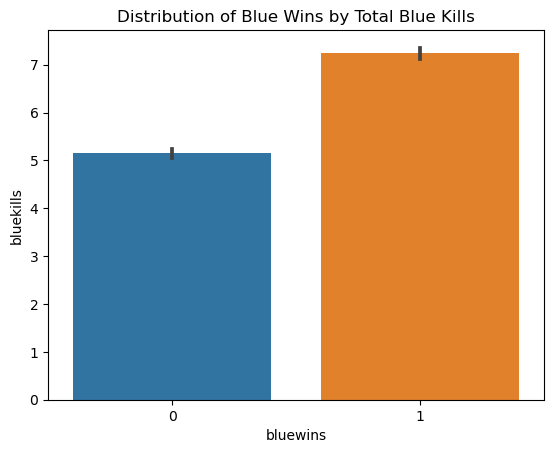

In [ ]:
sns.barplot(x='bluewins', y='bluekills', data=train)
plt.title('Distribution of Blue Wins by Total Blue Kills')
plt.show()

## Looks like getting more kills in the first 10 minutes leads to a higher win rate

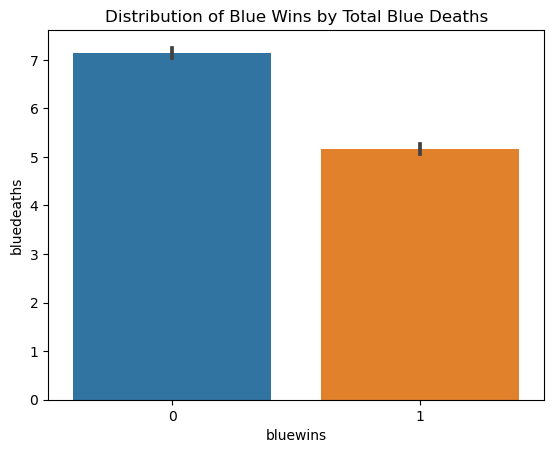

In [ ]:
sns.barplot(x='bluewins', y='bluedeaths', data=train)
plt.title('Distribution of Blue Wins by Total Blue Deaths')
plt.show()

## Looks like when blue teams die less in the first 10 minutes, they win more

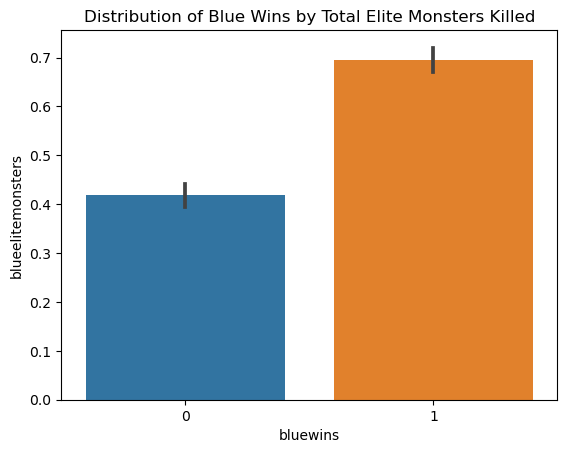

In [ ]:
sns.barplot(x='bluewins', y='blueelitemonsters', data=train)
plt.title('Distribution of Blue Wins by Total Elite Monsters Killed')
plt.show()

## Looks like there is a connection between more elite monsters killed in the first 10 minutes and higher win rate

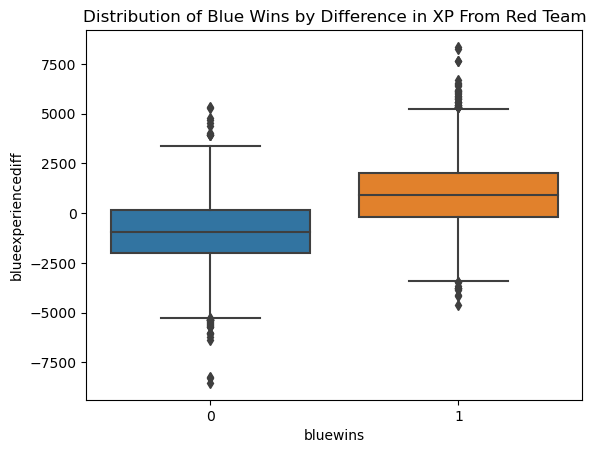

In [ ]:
sns.boxplot(x='bluewins', y='blueexperiencediff', data=train)
plt.title('Distribution of Blue Wins by Difference in XP From Red Team')
plt.show()

## Looks like blue team has an average of more experience in the first 10 minutes when they win

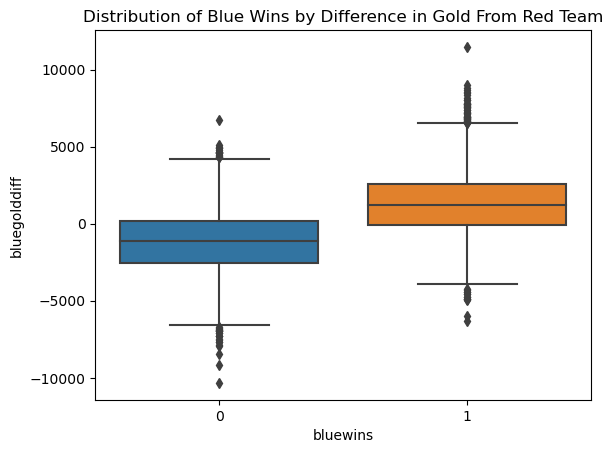

In [ ]:
sns.boxplot(x='bluewins', y='bluegolddiff', data=train)
plt.title('Distribution of Blue Wins by Difference in Gold From Red Team')
plt.show()

## Looks like blue team has an average of more gold in the first 10 minutes when they win

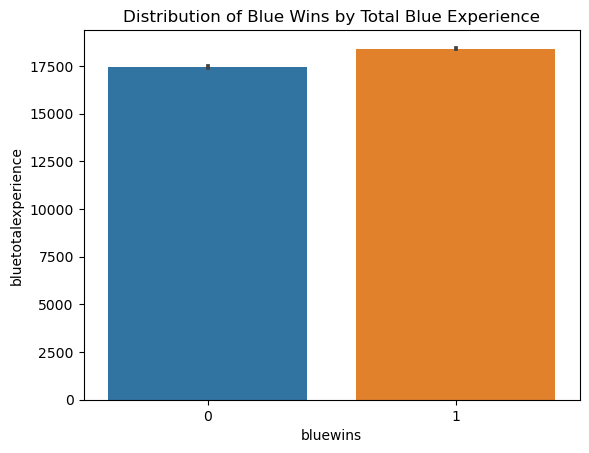

In [ ]:
sns.barplot(x='bluewins', y='bluetotalexperience', data=train)
plt.title('Distribution of Blue Wins by Total Blue Experience')
plt.show()

## Total Experience is our first that is not a clear takeaway and maybe isnt too strongly connected 

# Now one's we suspect will be less connected to wins

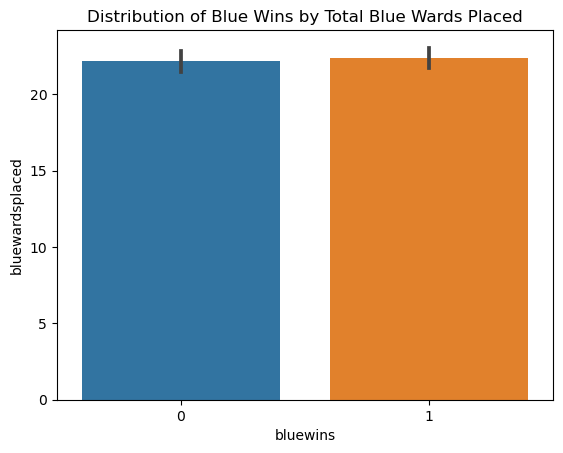

In [ ]:
sns.barplot(x='bluewins', y='bluewardsplaced', data=train)
plt.title('Distribution of Blue Wins by Total Blue Wards Placed')
plt.show()

## As we suspected, little to no connection

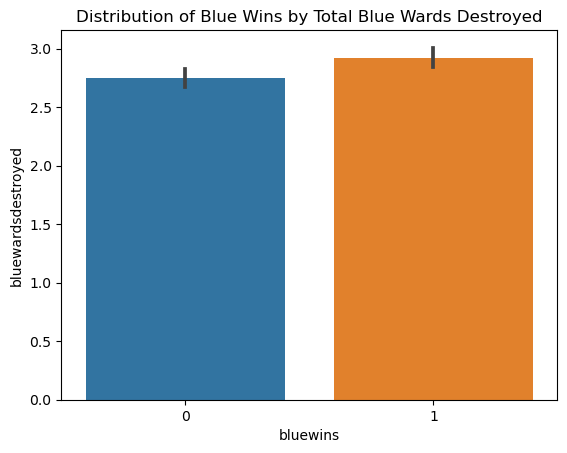

In [ ]:
sns.barplot(x='bluewins', y='bluewardsdestroyed', data=train)
plt.title('Distribution of Blue Wins by Total Blue Wards Destroyed')
plt.show()

## There might be a little more connection here, but still not as strong as some others

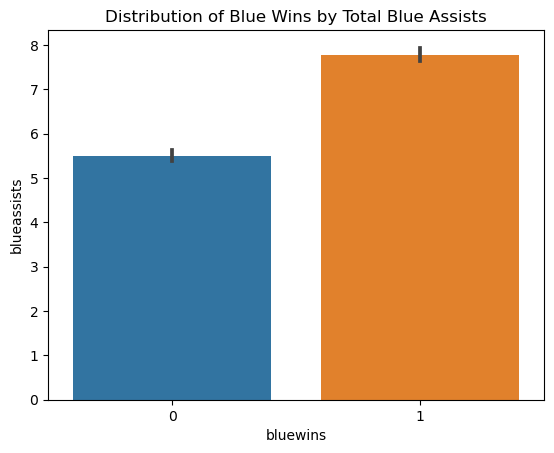

In [ ]:
sns.barplot(x='bluewins', y='blueassists', data=train)
plt.title('Distribution of Blue Wins by Total Blue Assists')
plt.show()

## Here's one that is connected, which makes sense because more kills often mean more assists

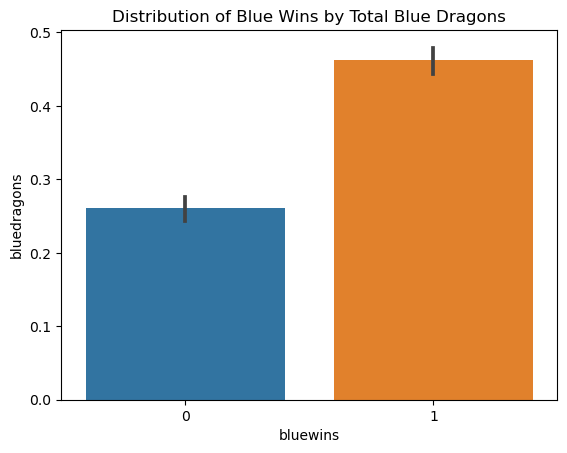

In [ ]:
sns.barplot(x='bluewins', y='bluedragons', data=train)
plt.title('Distribution of Blue Wins by Total Blue Dragons')
plt.show()

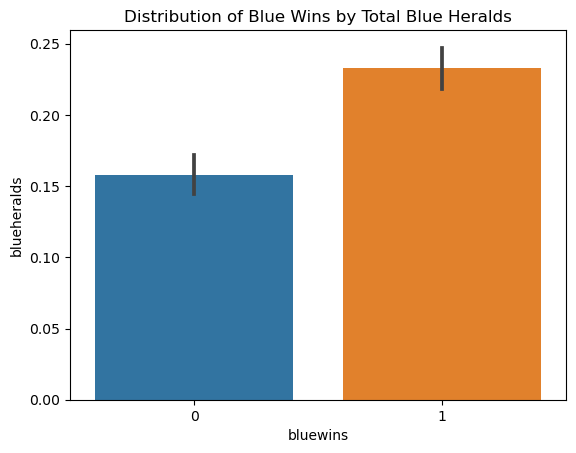

In [ ]:
sns.barplot(x='bluewins', y='blueheralds', data=train)
plt.title('Distribution of Blue Wins by Total Blue Heralds')
plt.show()

## While both of these are connected, dragons and heralds are elite monsters, which is a already a category we know to be connected

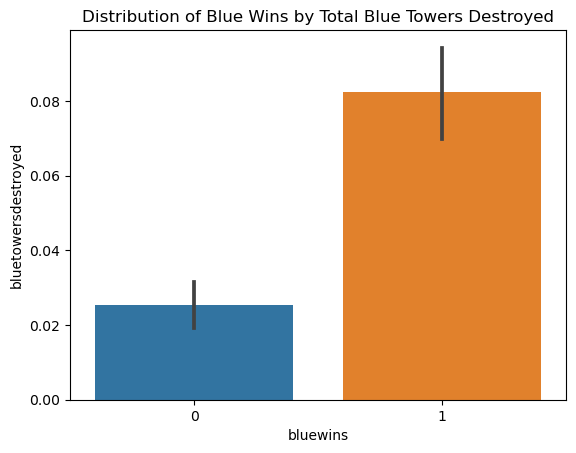

In [ ]:
sns.barplot(x='bluewins', y='bluetowersdestroyed', data=train)
plt.title('Distribution of Blue Wins by Total Blue Towers Destroyed')
plt.show()

## Towers destroyed in the first 10 minutes looks to be very strongly connected to winning

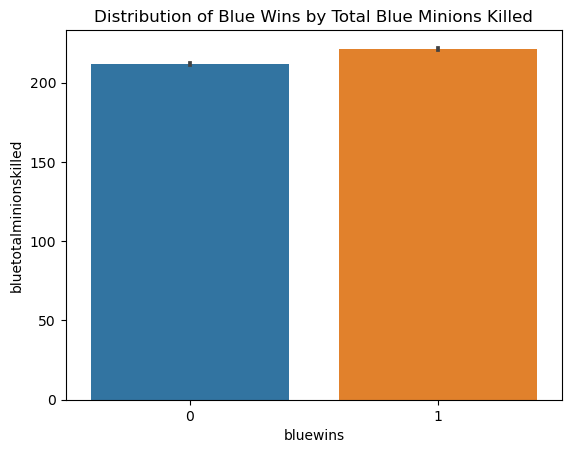

In [ ]:
sns.barplot(x='bluewins', y='bluetotalminionskilled', data=train)
plt.title('Distribution of Blue Wins by Total Blue Minions Killed')
plt.show()

## As we suspected, little to no connection

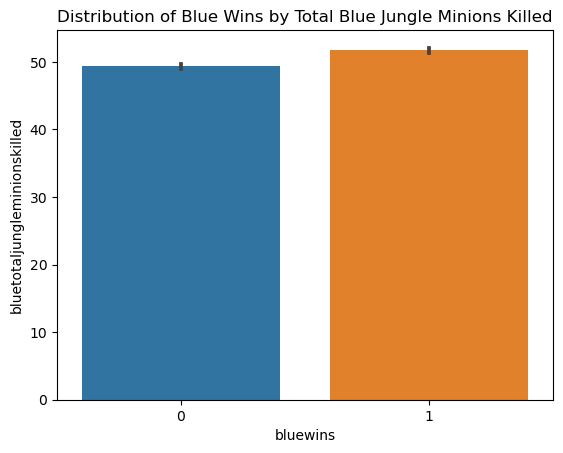

In [ ]:
sns.barplot(x='bluewins', y='bluetotaljungleminionskilled', data=train)
plt.title('Distribution of Blue Wins by Total Blue Jungle Minions Killed')
plt.show()

## Little to no connection

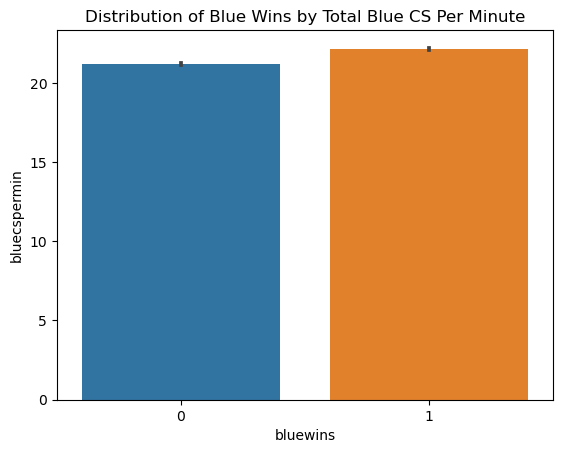

In [ ]:
sns.barplot(x='bluewins', y='bluecspermin', data=train)
plt.title('Distribution of Blue Wins by Total Blue CS Per Minute')
plt.show()

## Little to no connection

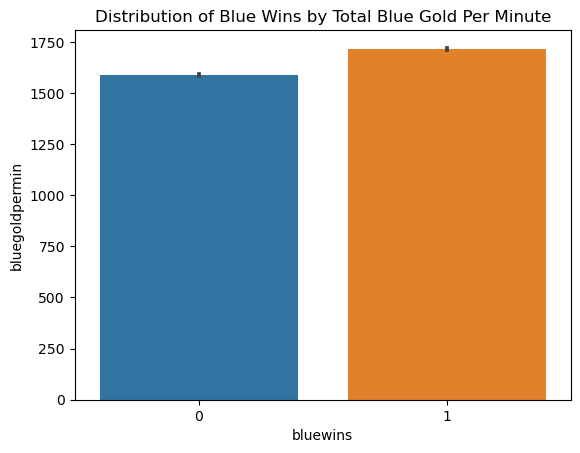

In [ ]:
sns.barplot(x='bluewins', y='bluegoldpermin', data=train)
plt.title('Distribution of Blue Wins by Total Blue Gold Per Minute')
plt.show()

## Looks to be connected

## Looking at engineered columns

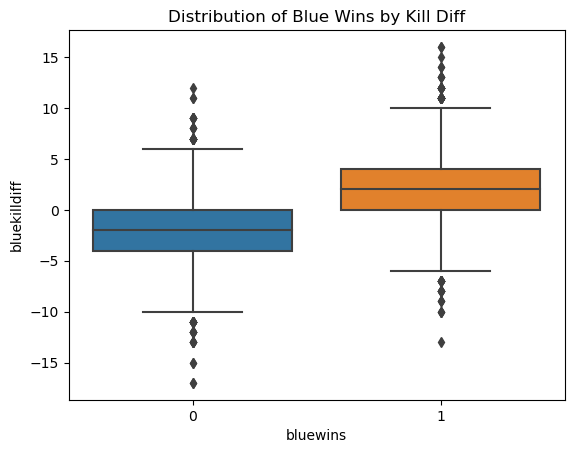

In [ ]:
sns.boxplot(x='bluewins', y='bluekilldiff', data=train)
plt.title('Distribution of Blue Wins by Kill Diff')
plt.show()

## Looks like blue team wins more when they get more kills than red team in the first ten minutes

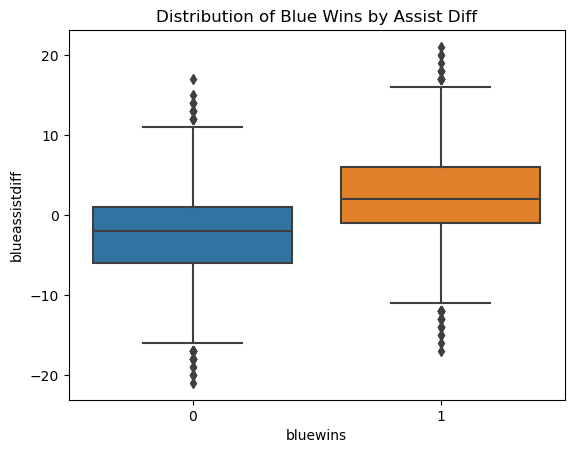

In [ ]:
sns.boxplot(x='bluewins', y='blueassistdiff', data=train)
plt.title('Distribution of Blue Wins by Assist Diff')
plt.show()

## Looks like blue team wins more when they work together and get assists

# Takeaways from graphing:
## Getting first kill, more kills, more kills than the enemy team, less deaths, get more assists, killing more elite monsters, more experience, more gold, more assists, and probably most importantly is more towers destroyed in the first 10 minutes all lead to higher chance of winning 

# Let's use stats testing to confirm

## Runnin a chi2 test on first blood and wins because of 2 categorical


In [ ]:
# Runnin a chi2 test on first blood and wins because of 2 categorical
observed = pd.crosstab(train['bluefirstblood'], train['bluewins'])
observed


bluewins,0,1
bluefirstblood,,
0,1622,1092
1,1130,1688


In [ ]:
chi2, p, degf, expected = stats.chi2_contingency(observed)
p

2.939273151709162e-48

In [ ]:
alpha = 0.05

if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between first blood and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between first blood and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between first blood and wins. They are not independent.


## First blood is connected to wins

In [ ]:
# stats testing on blue wards destroyed
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winwards = train[train.bluewins == 1]['bluewardsdestroyed']
losswards = train[train.bluewins != 1]['bluewardsdestroyed']
t_stat, p = stats.ttest_ind(winwards, losswards, equal_var=True)
t_stat, p

(3.0124320342480586, 0.0026033640086418415)

In [ ]:
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue wards destroyed and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue wards destroyed and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue wards destroyed and wins. They are not independent.


## Blue wards destrotyed is connected to wins

In [ ]:
# stats testing on blue wards placed
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winwards = train[train.bluewins == 1]['bluewardsplaced']
losswards = train[train.bluewins != 1]['bluewardsplaced']
t_stat, p = stats.ttest_ind(winwards, losswards, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue wards placed and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue wards placed and wins. They are independent.')

Fail to reject the null. Meaning, there is not an association between blue wards placed and wins. They are independent.


## Confirmed no strong relationship between blue wards placed and wins

In [ ]:
# stats testing on blue kills
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winkills = train[train.bluewins == 1]['bluekills']
losskills = train[train.bluewins != 1]['bluekills']
t_stat, p = stats.ttest_ind(winkills, losskills, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue kills and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue kills and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue kills and wins. They are not independent.


## Confrimed connection between blue kills and wins

In [ ]:
# stats testing on blue deaths
# Running a t test because there is one continuous and one categorical variable
alpha = .05
windeaths = train[train.bluewins == 1]['bluedeaths']
lossdeaths = train[train.bluewins != 1]['bluedeaths']
t_stat, p = stats.ttest_ind(windeaths, lossdeaths, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue deaths and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue deaths and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue deaths and wins. They are not independent.


## Confrimed connection between blue deaths and wins

In [ ]:
# stats testing on blue assists
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winassists = train[train.bluewins == 1]['blueassists']
lossassists = train[train.bluewins != 1]['blueassists']
t_stat, p = stats.ttest_ind(winassists, lossassists, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue assists and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue assists and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue assists and wins. They are not independent.


## Confirmed connection between blue assists and wins

In [ ]:
# stats testing on blue elite monsters
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winmon = train[train.bluewins == 1]['blueelitemonsters']
lossmon = train[train.bluewins != 1]['blueelitemonsters']
t_stat, p = stats.ttest_ind(winmon, lossmon, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue elite monsters and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue elite monsters and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue elite monsters and wins. They are not independent.


## Confirmed connection between blue elite monsters and wins

In [ ]:
# stats testing on blue towers destroyed
# Running a t test because there is one continuous and one categorical variable
alpha = .05
wintower = train[train.bluewins == 1]['bluetowersdestroyed']
losstower = train[train.bluewins != 1]['bluetowersdestroyed']
t_stat, p = stats.ttest_ind(wintower, losstower, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue towers destroyed and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue towers destroyed and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue towers destroyed and wins. They are not independent.


## Confirmed connection between blue towers destroyed and wins

In [ ]:
# stats testing on blue total gold
# Running a t test because there is one continuous and one categorical variable
alpha = .05
wingold = train[train.bluewins == 1]['bluetotalgold']
lossgold = train[train.bluewins != 1]['bluetotalgold']
t_stat, p = stats.ttest_ind(wingold, lossgold, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue total gold and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue total gold and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue total gold and wins. They are not independent.


## Confirmed connection between blue total gold and wins

In [ ]:
# stats testing on blue average level
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winavglvl = train[train.bluewins == 1]['blueavglevel']
lossavglvl = train[train.bluewins != 1]['blueavglevel']
t_stat, p = stats.ttest_ind(winavglvl, lossavglvl, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue average level and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue average level and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue average level and wins. They are not independent.


## Confirmed connection between blue average level and wins

In [ ]:
# stats testing on blue total experience
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winxp = train[train.bluewins == 1]['bluetotalexperience']
lossxp = train[train.bluewins != 1]['bluetotalexperience']
t_stat, p = stats.ttest_ind(winxp, lossxp, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue total experience and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue total experience and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue total experience and wins. They are not independent.


## Confirmed connection between blue total experience and wins

In [ ]:
# stats testing on blue total minions killed
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winmin = train[train.bluewins == 1]['bluetotalminionskilled']
lossmin = train[train.bluewins != 1]['bluetotalminionskilled']
t_stat, p = stats.ttest_ind(winmin, lossmin, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue total minions killed and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue total minions killed and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue total minions killed and wins. They are not independent.


## Confirmed connection between blue total minions killed and wins

In [ ]:
# stats testing on blue jungle total minions killed
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winjgmin = train[train.bluewins == 1]['bluetotaljungleminionskilled']
lossjgmin = train[train.bluewins != 1]['bluetotaljungleminionskilled']
t_stat, p = stats.ttest_ind(winjgmin, lossjgmin, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue total jungle minions killed and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue total jungle minions killed and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue total jungle minions killed and wins. They are not independent.


## Confirmed connection between total jungle minions killed and wins

In [ ]:
# stats testing on blue gold diff
# Running a t test because there is one continuous and one categorical variable
alpha = .05
wingdiff = train[train.bluewins == 1]['bluegolddiff']
lossgdiff = train[train.bluewins != 1]['bluegolddiff']
t_stat, p = stats.ttest_ind(wingdiff, lossgdiff, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue gold diff and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue gold diff and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue gold diff and wins. They are not independent.


## Confirmed connection between blue gold diff and wins

In [ ]:
# stats testing on blue xp diff
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winxpdiff = train[train.bluewins == 1]['blueexperiencediff']
lossxpdiff = train[train.bluewins != 1]['blueexperiencediff']
t_stat, p = stats.ttest_ind(winxpdiff, lossxpdiff, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue xp diff and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue xp diff and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue xp diff and wins. They are not independent.


## Confirmed connection between blue xp diff and wins

In [ ]:
# stats testing on blue cs per min
# Running a t test because there is one continuous and one categorical variable
alpha = .05
wincs = train[train.bluewins == 1]['bluecspermin']
losscs = train[train.bluewins != 1]['bluecspermin']
t_stat, p = stats.ttest_ind(wincs, losscs, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue cs per min and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue cs per min and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue cs per min and wins. They are not independent.


## Confirmed connection between blue cs per minute and wins

In [ ]:
# stats testing on blue gold per min
# Running a t test because there is one continuous and one categorical variable
alpha = .05
wingpm = train[train.bluewins == 1]['bluegoldpermin']
lossgpm = train[train.bluewins != 1]['bluegoldpermin']
t_stat, p = stats.ttest_ind(wingpm, lossgpm, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue gold per min and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue gold per min and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue gold per min and wins. They are not independent.


## Confirmed connection between blue gold per minute and wins

In [ ]:
# stats testing on blue kill diff
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winkdif = train[train.bluewins == 1]['bluekilldiff']
losskdif = train[train.bluewins != 1]['bluekilldiff']
t_stat, p = stats.ttest_ind(winkdif, losskdif, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue kill diff and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue kill diff and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue kill diff and wins. They are not independent.


## Confirmed connection between blue kill diff and wins

In [ ]:
# stats testing on blue assist diff
# Running a t test because there is one continuous and one categorical variable
alpha = .05
winadif = train[train.bluewins == 1]['blueassistdiff']
lossadif = train[train.bluewins != 1]['blueassistdiff']
t_stat, p = stats.ttest_ind(winadif, lossadif, equal_var=True)
if p < alpha:
    print('Reject the null hypothesis. Meaning, there is an association between blue assist diff and wins. They are not independent.')
else:
    print('Fail to reject the null. Meaning, there is not an association between blue assist diff and wins. They are independent.')

Reject the null hypothesis. Meaning, there is an association between blue assist diff and wins. They are not independent.


## Confirmed connection between blue assist diff and wins

# Takeaways from stats testing:
## Every blue team stat besides blue wards placed is connected to wins (maybe vision is not that important). So far, we can see that there are a lot of factors that lead to winning and this dataset has a lot if not all of them as columns. 

## Now I'm interested if less wards could cause more deaths, let's graph

<Axes: xlabel='bluewardsplaced', ylabel='bluedeaths'>

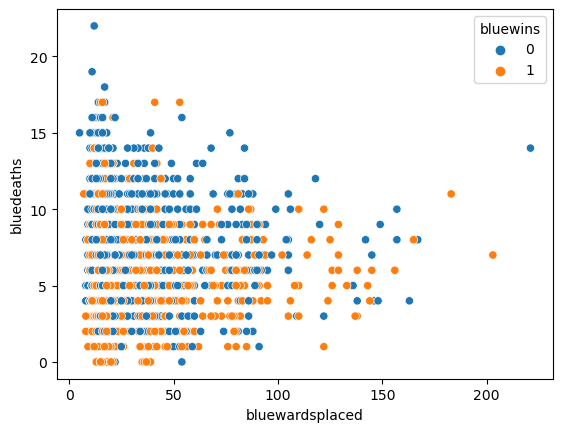

In [ ]:
sns.scatterplot(x='bluewardsplaced', y='bluedeaths', hue='bluewins', data=train)


## It looks like less wards does not mean more deaths

<Axes: xlabel='bluekills', ylabel='bluedeaths'>

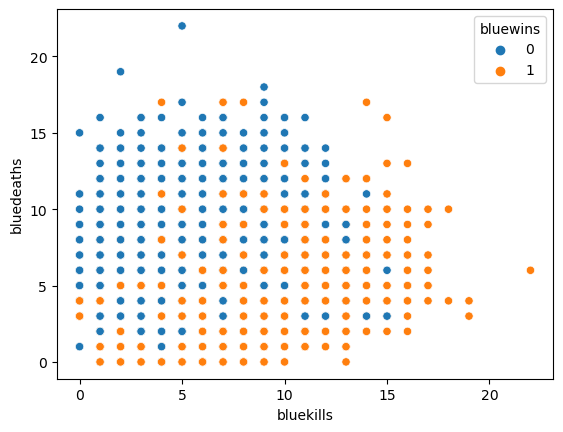

In [ ]:
sns.scatterplot(x='bluekills', y='bluedeaths', hue='bluewins', data=train)

## It looks like players who get more kills tend to die less

## I feel like it must still be important to kill elite monsters because they make you stronger, which could lead to more kills. Let's see

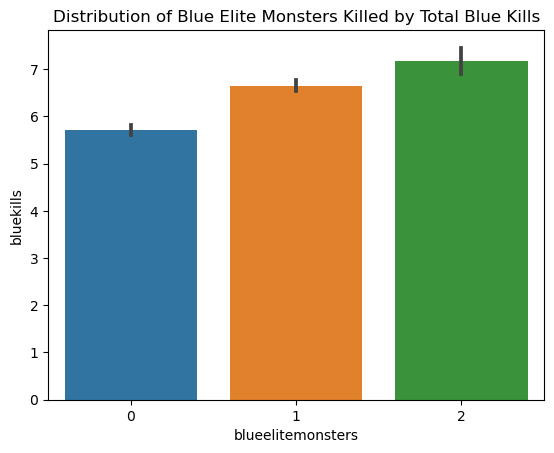

In [ ]:
sns.barplot(x='blueelitemonsters', y='bluekills', data=train)
plt.title('Distribution of Blue Elite Monsters Killed by Total Blue Kills')
plt.show()

## It looks like killing more elite monsters leads to more kills on the opposing team

## Let's look at minions killed to kills, too

<Axes: xlabel='bluetotalminionskilled', ylabel='bluekills'>

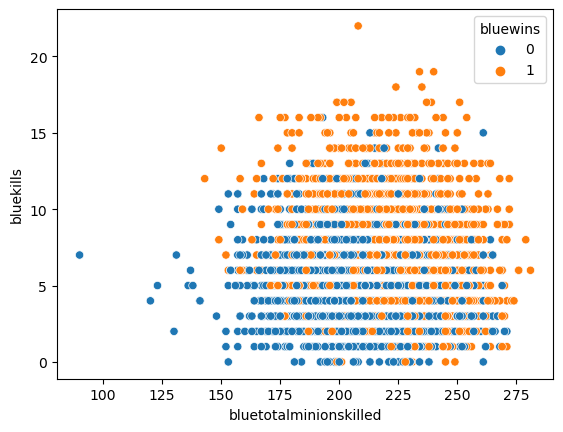

In [ ]:
sns.scatterplot(x='bluetotalminionskilled', y='bluekills', hue='bluewins', data=train)


# It looks like although elite monsters and minions killed may not be as big of drivers of wins as kills, they do both lead to more kills

# Let's use SelectKBest and RFE models to confirm drivers of wins

In [ ]:
X_train = train.drop(columns=['bluewins'])
y_train = train.bluewins

X_val = val.drop(columns=['bluewins'])
y_val = val.bluewins

X_test = test.drop(columns=['bluewins'])
y_test = test.bluewins

In [ ]:
# Create the model
kbest = SelectKBest(score_func=f_regression, k=4)
# Fit
kbest.fit(X_train, y_train)
# Create the mask
feature_mask = kbest.get_support()
# Now we are going to ask for the column names of select k best top 2 features
X_train.columns[feature_mask]

Index(['bluegolddiff', 'blueexperiencediff', 'redgolddiff',
       'redexperiencediff'],
      dtype='object')

In [ ]:
# Create the algorithm
lm = LinearRegression()
# Assign the number of feature
rfe = RFE(estimator=lm, n_features_to_select=4)
# Now we are fitting those features to our train set
X_rfe = rfe.fit(X_train, y_train)
# Create a variable that takes X_train and turns rfe features into a list
rfe_columns = X_train.columns[rfe.support_].tolist()
# Call the variable
rfe_columns

['bluetotalexperience',
 'blueexperiencediff',
 'redtotalexperience',
 'redexperiencediff']

## Initially, the diff categories and only experience categories are the top drivers. BUT we will now take out red diff categories because they will the inverse of the blue diff columns, meaning if blue has 8 diff then red will have -8 diff, therefore making it an equal driver. We also need to take out red first blood because if one team gets first blood, the other doesnt.

# It looks like, so far, experience is the most important factor in winning

In [ ]:
X_train = train.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 'redfirstblood'])
y_train = train.bluewins

X_val = val.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 'redfirstblood'])
y_val = val.bluewins

X_test = test.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 'redfirstblood'])
y_test = test.bluewins

In [ ]:
# Create the model
kbest = SelectKBest(score_func=f_regression, k=4)
# Fit
kbest.fit(X_train, y_train)
# Create the mask
feature_mask = kbest.get_support()
# Now we are going to ask for the column names of select k best top 2 features
X_train.columns[feature_mask]

Index(['bluegolddiff', 'blueexperiencediff', 'bluegoldpermin', 'bluekilldiff'], dtype='object')

In [ ]:
# Create the algorithm
lm = LinearRegression()
# Assign the number of feature
rfe = RFE(estimator=lm, n_features_to_select=4)
# Now we are fitting those features to our train set
X_rfe = rfe.fit(X_train, y_train)
# Create a variable that takes X_train and turns rfe features into a list
rfe_columns = X_train.columns[rfe.support_].tolist()
# Call the variable
rfe_columns

['bluetotalgold', 'bluegolddiff', 'redtotalgold', 'redgoldpermin']

# So I am getting a lot of information even with different factors from each model. We can see that blue team wins when they have more total gold and experience than red team. Let's add factors so we can give 3 takeaways (10 factors instead of 4)(Tried 6 and 8 as well and got mostly gold and experience columns)

In [ ]:
# Create the model
kbest = SelectKBest(score_func=f_regression, k=10)
# Fit
kbest.fit(X_train, y_train)
# Create the mask
feature_mask = kbest.get_support()
# Now we are going to ask for the column names of select k best top 2 features
X_train.columns[feature_mask]

Index(['bluetotalgold', 'bluetotalexperience', 'bluegolddiff',
       'blueexperiencediff', 'bluegoldpermin', 'redtotalgold',
       'redtotalexperience', 'redgoldpermin', 'bluekilldiff',
       'blueassistdiff'],
      dtype='object')

In [ ]:
# Create the algorithm
lm = LinearRegression()
# Assign the number of feature
rfe = RFE(estimator=lm, n_features_to_select=10)
# Now we are fitting those features to our train set
X_rfe = rfe.fit(X_train, y_train)
# Create a variable that takes X_train and turns rfe features into a list
rfe_columns = X_train.columns[rfe.support_].tolist()
# Call the variable
rfe_columns

['bluekills',
 'bluedeaths',
 'bluetotalgold',
 'bluetotalexperience',
 'bluegolddiff',
 'blueexperiencediff',
 'bluegoldpermin',
 'redtotalgold',
 'redtotalexperience',
 'redgoldpermin']

# Takeaway:
## Having more gold and more experience are most important. More kills than the other team, less deaths, and more assists than the other team also drive wins (basically a higher KDA in the first ten minutes)

## I find it surprising:
* Blue towers destroyed did not make it into the top ten drivers because of the graph of distribution across wins and losses looked like it would have a strong connection
* Wards placed is not strongly connected because in the game players put high priority on vision to avoid opposing players getting kills because they were able to approach undetected
* Minions killed (minions, jungle minions, and cs per min) does not have a bigger affect because this is a stat that players put a high priority on

# Let's move on to modeling in order to predict wins off of bluegolddiff, blueexperiencediff, bluekilldiff, bluedeaths, blueassistdiff

### Planning---Wrangling---Exploration---MODELING---Delivery

## Baseline:

In [ ]:
train.bluewins.value_counts()

bluewins
1    2780
0    2752
Name: count, dtype: int64

In [ ]:
train['baseline_prediction'] = 1
baseline_accuracy = (train.baseline_prediction == train.bluewins).mean()
print(f'baseline accuracy: {baseline_accuracy:.2%}')

baseline accuracy: 50.25%


In [ ]:
train = train.drop(columns=['baseline_prediction'])

## Baseline is 50.25% accurate

## Lets run a logistic regression model on bluegolddiff, blueexperiencediff, bluekilldiff, bluedeaths, blueassistdiff, since they to have the most correlation with blue wins

In [ ]:
X_train = train.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 
                            'redfirstblood', 'bluewardsplaced', 'bluewardsdestroyed', 'bluefirstblood', 'bluekills', 
                            'blueassists', 'blueelitemonsters', 'bluedragons', 'blueheralds', 
                            'bluetowersdestroyed', 'bluetotalgold', 'blueavglevel', 'bluetotalexperience', 
                            'bluetotalminionskilled', 'bluetotaljungleminionskilled', 'bluecspermin', 
                            'bluegoldpermin', 'redwardsplaced', 'redwardsdestroyed', 'redfirstblood', 'redkills', 'reddeaths', 'redassists',
                            'redelitemonsters', 'reddragons', 'redheralds', 'redtowersdestroyed',
                            'redtotalgold', 'redavglevel', 'redtotalexperience',
                            'redtotalminionskilled', 'redtotaljungleminionskilled', 'redgolddiff',
                            'redexperiencediff', 'redcspermin', 'redgoldpermin', 'bluekilldiff',
                            'blueassistdiff'])
y_train = train.bluewins

X_val = val.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 
                            'redfirstblood', 'bluewardsplaced', 'bluewardsdestroyed', 'bluefirstblood', 'bluekills', 
                            'blueassists', 'blueelitemonsters', 'bluedragons', 'blueheralds', 
                            'bluetowersdestroyed', 'bluetotalgold', 'blueavglevel', 'bluetotalexperience', 
                            'bluetotalminionskilled', 'bluetotaljungleminionskilled', 'bluecspermin', 
                            'bluegoldpermin', 'redwardsplaced', 'redwardsdestroyed', 'redfirstblood', 'redkills', 'reddeaths', 'redassists',
                            'redelitemonsters', 'reddragons', 'redheralds', 'redtowersdestroyed',
                            'redtotalgold', 'redavglevel', 'redtotalexperience',
                            'redtotalminionskilled', 'redtotaljungleminionskilled', 'redgolddiff',
                            'redexperiencediff', 'redcspermin', 'redgoldpermin', 'bluekilldiff',
                            'blueassistdiff'])
y_val = val.bluewins

X_test = test.drop(columns=['bluewins', 'redexperiencediff', 'redgolddiff', 
                            'redfirstblood', 'bluewardsplaced', 'bluewardsdestroyed', 'bluefirstblood', 'bluekills', 
                            'blueassists', 'blueelitemonsters', 'bluedragons', 'blueheralds', 
                            'bluetowersdestroyed', 'bluetotalgold', 'blueavglevel', 'bluetotalexperience', 
                            'bluetotalminionskilled', 'bluetotaljungleminionskilled', 'bluecspermin', 
                            'bluegoldpermin', 'redwardsplaced', 'redwardsdestroyed', 'redfirstblood', 'redkills', 'reddeaths', 'redassists',
                            'redelitemonsters', 'reddragons', 'redheralds', 'redtowersdestroyed',
                            'redtotalgold', 'redavglevel', 'redtotalexperience',
                            'redtotalminionskilled', 'redtotaljungleminionskilled', 'redgolddiff',
                            'redexperiencediff', 'redcspermin', 'redgoldpermin', 'bluekilldiff',
                            'blueassistdiff'])
y_test = test.bluewins


In [ ]:
logit = LogisticRegression(C=1, random_state=123)
logit.fit(X_train, y_train)
y_pred = logit.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.73      0.73      0.73      2752
           1       0.73      0.73      0.73      2780

    accuracy                           0.73      5532
   macro avg       0.73      0.73      0.73      5532
weighted avg       0.73      0.73      0.73      5532



In [ ]:
logit = LogisticRegression(C=1, random_state=123)
logit.fit(X_val, y_val)
y_pred = logit.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.72      0.72      1186
           1       0.72      0.72      0.72      1185

    accuracy                           0.72      2371
   macro avg       0.72      0.72      0.72      2371
weighted avg       0.72      0.72      0.72      2371



## Logistic regression gives 73% accuracy on train and 72% on validate, much better than 50% baseline

## Let's try KNN on 5 neighbors

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn.fit(X_train, y_train)
y_pred = knn.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.78      0.78      2752
           1       0.79      0.78      0.78      2780

    accuracy                           0.78      5532
   macro avg       0.78      0.78      0.78      5532
weighted avg       0.78      0.78      0.78      5532



In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn.fit(X_val, y_val)
y_pred = knn.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.79      0.78      1186
           1       0.79      0.76      0.77      1185

    accuracy                           0.78      2371
   macro avg       0.78      0.78      0.78      2371
weighted avg       0.78      0.78      0.78      2371



## KNN gives 78% on both train and validate, so far it's our best

In [ ]:
knn = KNeighborsClassifier(n_neighbors=10, weights='uniform')
knn.fit(X_train, y_train)
y_pred = knn.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.81      0.77      2752
           1       0.79      0.69      0.74      2780

    accuracy                           0.75      5532
   macro avg       0.76      0.75      0.75      5532
weighted avg       0.76      0.75      0.75      5532



In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance')
knn.fit(X_train, y_train)
y_pred = knn.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2752
           1       1.00      1.00      1.00      2780

    accuracy                           1.00      5532
   macro avg       1.00      1.00      1.00      5532
weighted avg       1.00      1.00      1.00      5532



### Got worse with more neighbors

## Let's try decision tree (max depth 2)

In [ ]:
clf = DT(max_depth=2)
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

In [ ]:
# predict off of the dataset and look at the performance of the model
model_1_preds = clf.predict(X_train)
print(classification_report(y_train, model_1_preds))

              precision    recall  f1-score   support

           0       0.71      0.76      0.74      2752
           1       0.75      0.69      0.72      2780

    accuracy                           0.73      5532
   macro avg       0.73      0.73      0.73      5532
weighted avg       0.73      0.73      0.73      5532



In [ ]:
clf = DT(max_depth=2)
clf.fit(X_val, y_val)
# predict off of the dataset and look at the performance of the model
model_1_preds = clf.predict(X_val)
print(classification_report(y_val, model_1_preds))

              precision    recall  f1-score   support

           0       0.69      0.79      0.74      1186
           1       0.76      0.65      0.70      1185

    accuracy                           0.72      2371
   macro avg       0.73      0.72      0.72      2371
weighted avg       0.73      0.72      0.72      2371



## Decision tree with 2 max depth gives 73% on train and 72% accuracy on validate. KNN is still our best

## Let's try more depth (3)

In [ ]:
clf = DT(max_depth=3)
clf.fit(X_train, y_train)
model_1_preds = clf.predict(X_train)
print(classification_report(y_train, model_1_preds))

              precision    recall  f1-score   support

           0       0.71      0.76      0.74      2752
           1       0.75      0.69      0.72      2780

    accuracy                           0.73      5532
   macro avg       0.73      0.73      0.73      5532
weighted avg       0.73      0.73      0.73      5532



In [ ]:
clf = DT(max_depth=4)
clf.fit(X_val, y_val)
model_1_preds = clf.predict(X_val)
print(classification_report(y_val, model_1_preds))

              precision    recall  f1-score   support

           0       0.76      0.68      0.71      1186
           1       0.71      0.78      0.74      1185

    accuracy                           0.73      2371
   macro avg       0.73      0.73      0.73      2371
weighted avg       0.73      0.73      0.73      2371



## It got worse

## I want to try support vector machine

In [ ]:
clf = svm.SVC(decision_function_shape='ovo')
clf.fit(X_train, y_train)
model_1_preds = clf.predict(X_train)
print(classification_report(y_train, model_1_preds))

              precision    recall  f1-score   support

           0       0.73      0.73      0.73      2752
           1       0.73      0.73      0.73      2780

    accuracy                           0.73      5532
   macro avg       0.73      0.73      0.73      5532
weighted avg       0.73      0.73      0.73      5532



In [ ]:
clf.fit(X_val, y_val)
model_1_preds = clf.predict(X_val)
print(classification_report(y_val, model_1_preds))

              precision    recall  f1-score   support

           0       0.72      0.74      0.73      1186
           1       0.73      0.71      0.72      1185

    accuracy                           0.73      2371
   macro avg       0.73      0.73      0.73      2371
weighted avg       0.73      0.73      0.73      2371



## KNN on test

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn.fit(X_test, y_test)
y_pred = knn.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.81      0.80      1011
           1       0.79      0.77      0.78       965

    accuracy                           0.79      1976
   macro avg       0.79      0.79      0.79      1976
weighted avg       0.79      0.79      0.79      1976



# Takeaway from modeling:
## KNN model is our best, with no drop off from train to validate at 78% accuracy, and 79% on test.
## Logistic regression, decision tree, and svm all gave us 73% on train, and logistic regression gave 72% on validate

# KNN with 5 neighbors and uniform weight is our best model to predict wins based off of bluegolddiff, blueexperiencediff, bluekilldiff, bluedeaths, and blueassistdiff

### Planning---Acquisition---Preparation---Exploration---Modeling---DELIVERY

# My main takeaways:
## Our main drivers of blue team wins are bluegolddiff, blueexperiencediff, bluekilldiff, bluedeaths, and blueassistdiff. Our data shows that KDA (Kill/Death/Assist ratio) is the most important thing to focus on in order to win, because kills give experience and gold, and those are drivers of winning. By getting more kills you get more experience and gold than the other team, by limiting deaths you limit the opposing team's gold and experience, and getting more assists by working as a team can be an easier way to get kills in a game like League of Legends where 1 on 1 matchups are well-balanced across characters.
## Based off of almost 10,000 games in our dataset, we can predict when blue team will win based off of the difference between their gold, experience, kills, assists, and deaths compared to the opposing team within the first ten minutes in diamond ranked games using a KNN model with 5 neighbors and uniform weight with 79% accuracy on test data.

## I find it surprising:
* Blue towers destroyed did not make it into the top ten drivers because the graph of distribution across wins and losses looked like it would have a strong connection, and in general one must destroy towers to win because the game is either won by destroying all the enemy towers, or forfeit.
* Wards placed is not strongly connected because in the game players put high priority on vision to avoid opposing players getting kills because they were able to approach undetected
* Minions killed (minions, jungle minions, and cs per min) does not have a bigger affect because this is a stat that players put a high priority on, as well

# I recommend:
## KDA is everything!
## For players in diamond ranking, prioritize getting more kills and dying less than your opponent, and work as a team (work on your KDA), rather than focusing on minions, elite monsters, towers, and vision control.

# If I had time:
* I would gather more stats, such as average experience each player has on the character they are playing compared to the other team, because a team who is full of people who have more hours on the character they are playing might lead to them winning more often because they know how to react in varying situations.
* I would also like to see data for professional players, because players and fans would most likely be interested in what the teams are competing for most importantly in these games with money(as much as $11million) and contracts on the line and millions watching (5.1 million in 2022).

# Thank you so much for your time!